In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import muon as mu
from muon import prot as pt

/data/msun/miniconda3/envs/CITE/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Filter out warnings to minimize clutter
import warnings
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)

In [3]:
import sys
sys.path.append('/data/msun/projects/Stephen/PDAC_scRNA/')
from core_functions.process_annotate import *

In [4]:
sc.settings.n_jobs = -1

# load data

In [5]:
mdata = mu.read("/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/annotated_citeseq_nospleen.h5mu")

In [6]:
mdata

MuData object with n_obs × n_vars = 6547 × 55632
  obs:	'HT1', 'HT2', 'HT3', 'HT4', 'HT5', 'HT6', 'HT7', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'sample', 'condition', 'leiden'
  var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
  obsm:	'X_mofa', 'X_umap', 'X_umap_mofa'
  varm:	'LFs'
  obsp:	'connectivities', 'distances'
  2 modalities
    rna:	6547 x 55487
      obs:	'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res0_75', 'leiden_res1', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltype_V1', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
      var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'DEG_leiden_res0_25', 'celltype_V1_colors', 'celltypist_cell_label_coarse_colors', 'celltypist_cell_label_fine_colors', 'condition_colors', 'dendrogram_leiden_res0_25', 'hvg', 'leiden_colors', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_75', 'leiden_res0_75_colors', 'leiden_res1', 'leiden_res1_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts', 'log1p_norm', 'magiced', 'scaled'
      obsp:	'connectivities', 'distances'
    prot:	6547 x 145
      obs:	'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublets_markers'
      var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'Classification_colors', 'doublets_markers_colors', 'leiden_colors', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [7]:
cell_types_to_keep = ['CD8T_cells']
tmdata = mdata[mdata.mod['rna'].obs['celltype_V1'].isin(cell_types_to_keep)].copy()

In [8]:
tmdata

MuData object with n_obs × n_vars = 750 × 55632
  obs:	'HT1', 'HT2', 'HT3', 'HT4', 'HT5', 'HT6', 'HT7', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'sample', 'condition', 'leiden'
  var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
  obsm:	'X_mofa', 'X_umap', 'X_umap_mofa'
  varm:	'LFs'
  obsp:	'connectivities', 'distances'
  2 modalities
    rna:	750 x 55487
      obs:	'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res0_75', 'leiden_res1', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltype_V1', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
      var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
      uns:	'DEG_leiden_res0_25', 'celltypist_cell_label_fine_colors', 'condition_colors', 'dendrogram_leiden_res0_25', 'hvg', 'leiden_colors', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_75', 'leiden_res0_75_colors', 'leiden_res1', 'leiden_res1_colors', 'log1p', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts', 'log1p_norm', 'magiced', 'scaled'
      obsp:	'connectivities', 'distances'
    prot:	750 x 145
      obs:	'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'doublets_markers'
      var:	'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
      uns:	'Classification_colors', 'doublets_markers_colors', 'leiden_colors', 'neighbors', 'pca', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [9]:
trna = tmdata.mod['rna'].copy()

In [10]:
trna

AnnData object with n_obs × n_vars = 750 × 55487
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res0_75', 'leiden_res1', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltype_V1', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'hb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'DEG_leiden_res0_25', 'celltypist_cell_label_fine_colors', 'condition_colors', 'dendrogram_leiden_res0_25', 'hvg', 'leiden_colors', 'leiden_res0_25', 'leiden_res0_25_colors', 'leiden_res0_5', 'leiden_res0_5_colors', 'leiden_res0_75', 'leiden_res0_75

# process the data

In [11]:
# re normalize
trna.X = trna.layers['counts']
sc.pp.normalize_total(trna, target_sum=1e4)
sc.pp.log1p(trna)

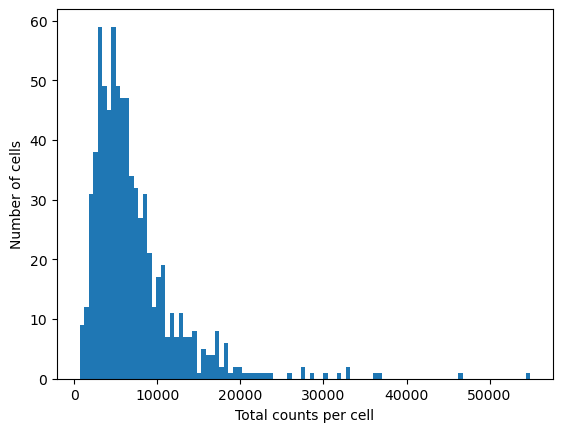

In [12]:
#check whether it is normalized 
total_counts = np.sum(trna.layers['counts'], axis=1)
plt.hist(total_counts, bins=100)
plt.xlabel('Total counts per cell')
plt.ylabel('Number of cells')
plt.show()

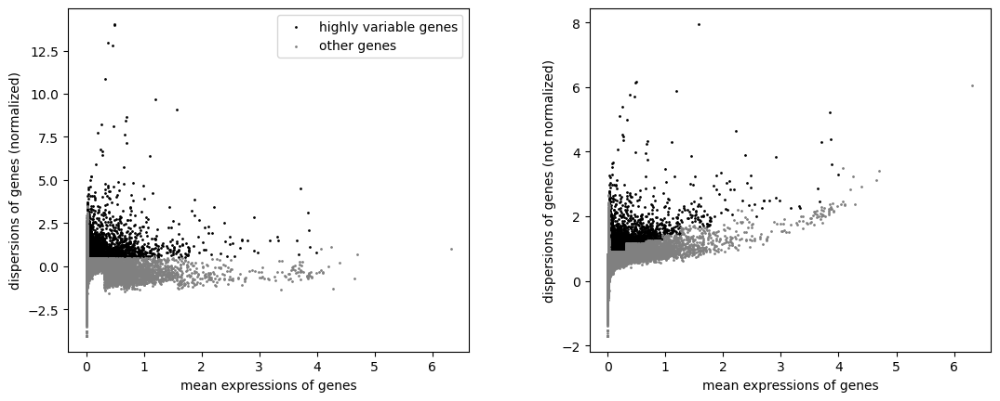

In [13]:
# feature selection
sc.pp.highly_variable_genes(trna, min_mean=0.02, max_mean=4, min_disp=0.5)
sc.pl.highly_variable_genes(trna)

In [14]:
# re scale
sc.pp.scale(trna, max_value=10)

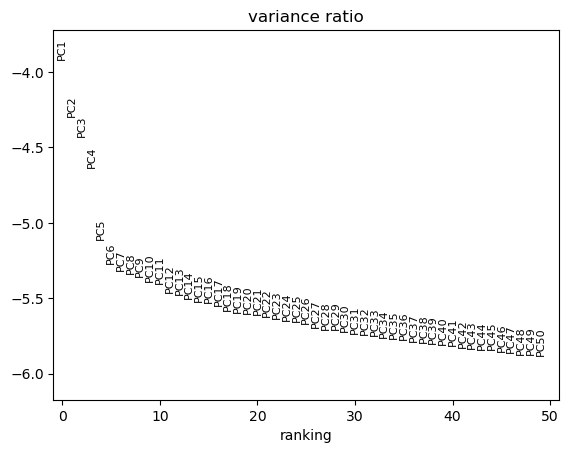

In [15]:
# Perform clustering on the subset
sc.tl.pca(trna, svd_solver='arpack')
sc.pl.pca_variance_ratio(trna, log=True,n_pcs=50)

In [16]:
sc.pp.neighbors(trna, n_neighbors=10, n_pcs=40)
sc.tl.umap(trna, spread=1., min_dist=.5, random_state=11)

In [17]:
sc.tl.leiden(trna, key_added="t_leiden_res0_25", resolution=0.25)
sc.tl.leiden(trna, key_added="t_leiden_res0_5", resolution=0.5)
sc.tl.leiden(trna, key_added="t_leiden_res0_75", resolution=0.75)
sc.tl.leiden(trna, key_added="t_leiden_res1", resolution=1.0)

In [18]:
sc.set_figure_params(scanpy=True, fontsize=24)

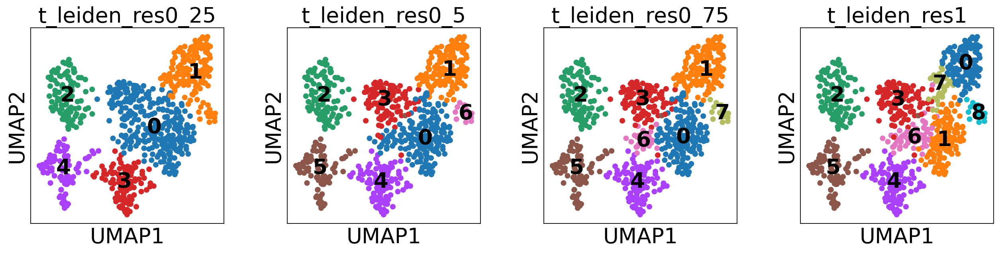

In [19]:
sc.pl.umap(
    trna,
    color=["t_leiden_res0_25", "t_leiden_res0_5", "t_leiden_res0_75","t_leiden_res1"],
    legend_loc="on data"
)

In [20]:
tmdata.mod['rna'] = trna

# Manual annotation

## annotate with cell markers

In [21]:
t_markers = {
    "Activated_T" : [
        "Pdcd1", "Sell","Cd43","Cd49a","Cd49d","Klrg1","Cxcr3","Cxcr6","Cx3cr1","Cd44"
    ],
    "Exh_prog": [
        "Tcf7", "Id3", "Ccr7", "Batf", "Id3", "Sell",
        "Xcl1", "Il7r", "Slamf6", "Cxcl10", "Socs3", "Zfp36l1", "Batf", 
        "Ctla4", "Bcl6", "Xcl1", "Nr4a3", "Cxcr5", "Ccr6","Bach2","Il6ra"
    ],
    "Exh_Int": [
        "S100a6","Crip1","S100a4","Lgals3","Vim","S100a10","S100a11",
        "Lgals1","Pglyrp1"
    ],
    "Eff_like": [
         "Havcr2","Gzmb","Pdcd1","Lag3","Nr4a1", "S100a6", "Crip1", "Gzmb","Mki67",
        "S100a4", "Lgals3", "Vim", "Lsp1", "S100a10", "S100a11", "Lgals1", 
        "Pglyrp1","Gzma","Eomes"
    ],
    "Exh_klr": [
        "Klf2", "Cx3cr1", "Zeb2", "Klre1", "Klrc1", "Klrd1", 
        "Klrg1", "Klra3"
    ],
    "Exh_term" : [
    "Cd7", "Cd160", "Rgs1", "Cxcr6",  
     "Nr4a2", "Tigit", "Lag3", "Sh2d2a", 
    "Glrx",  "Pdcd1",  "Trac",  "Hic1", "Id2", "Bhlhe41", 
     "Cxcr3", "Plac8", "Tox", "Prdm1"
    ]
 
}

In [22]:
#Subset the markers that were only detected in our data
marker_in_data = dict()
for ct, markers in t_markers.items():
    markers_found = list()
    for marker in markers:
        if marker in trna.var.index:
            markers_found.append(marker)
    if len(markers_found) != 0:
        marker_in_data[ct] = markers_found

ACTIVATED_T:


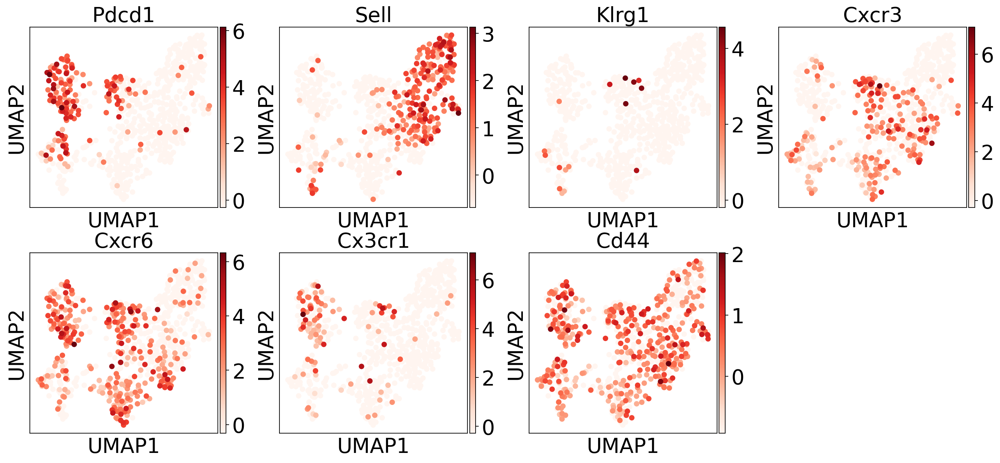





EXH_PROG:


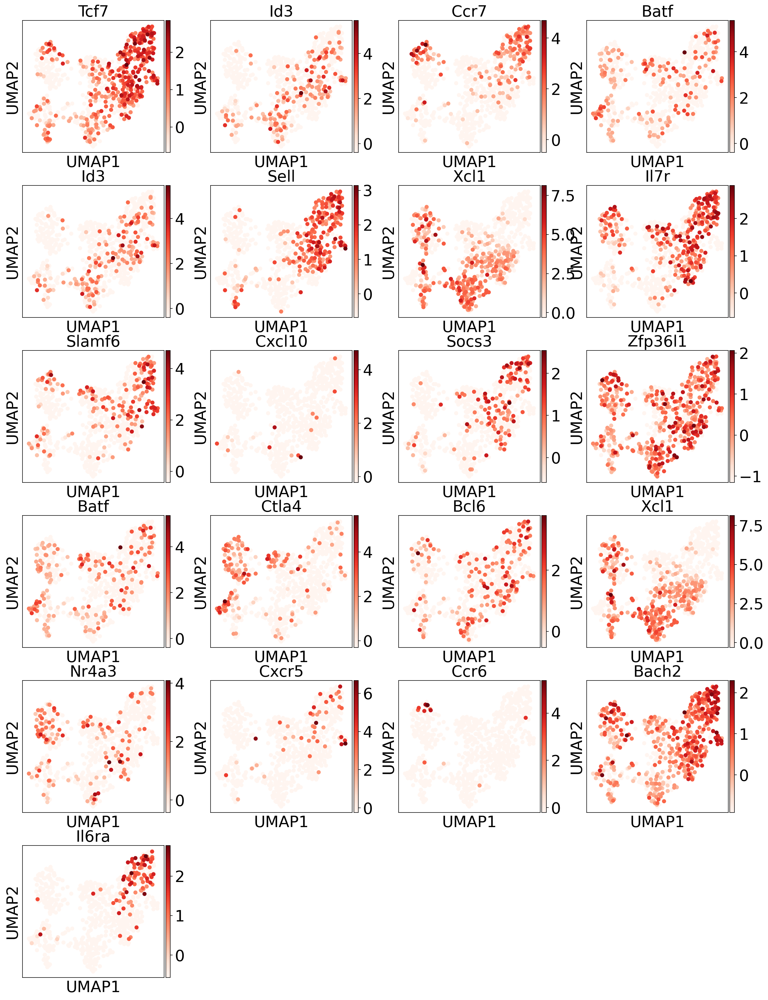





EXH_INT:


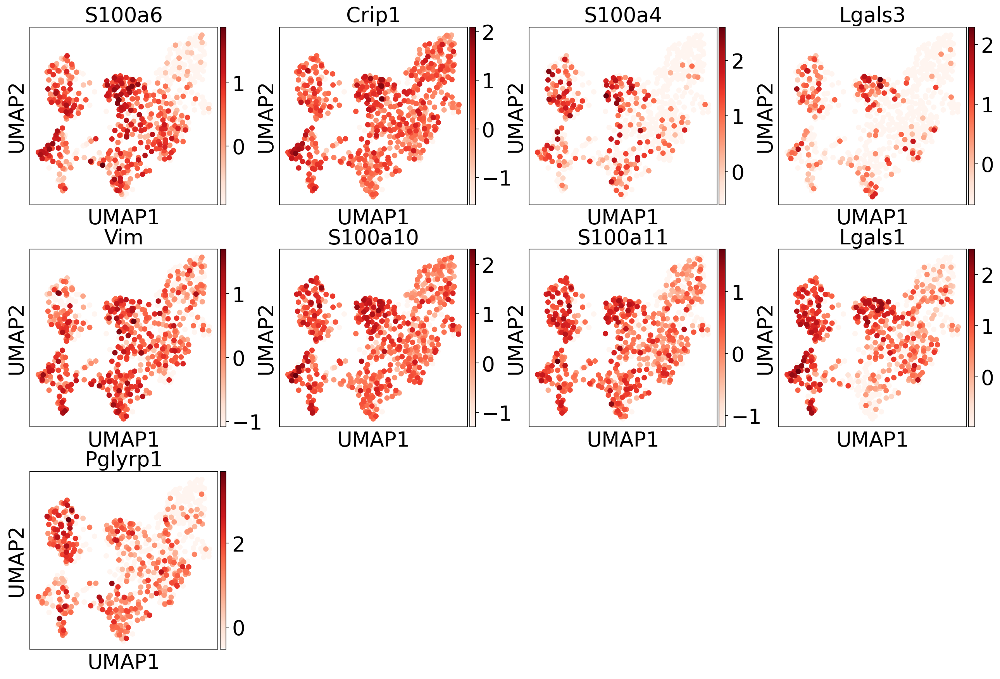





EFF_LIKE:


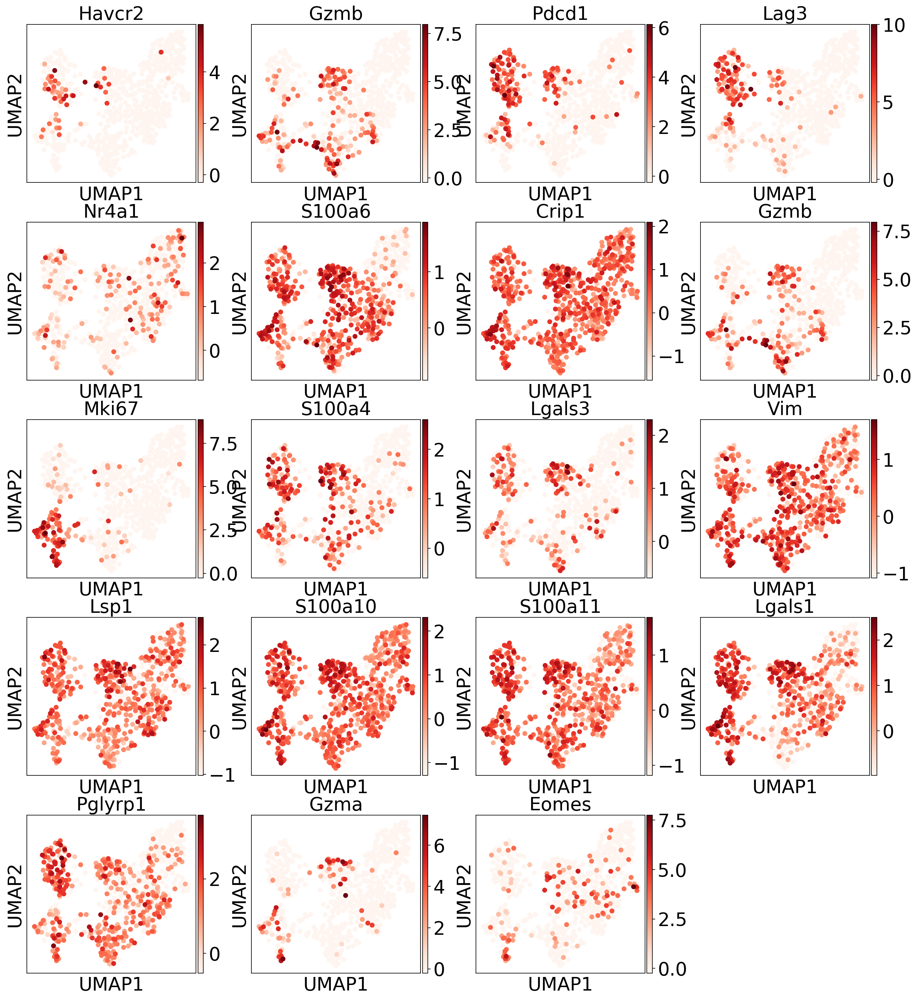





EXH_KLR:


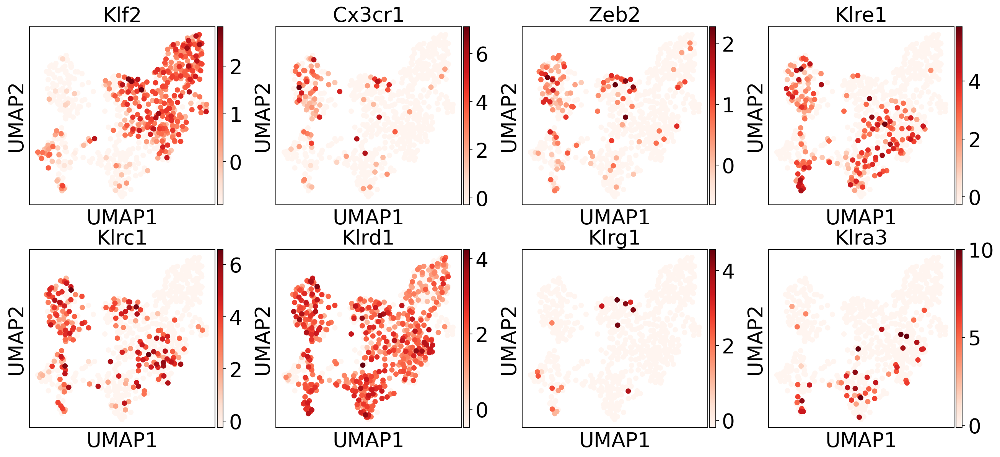





EXH_TERM:


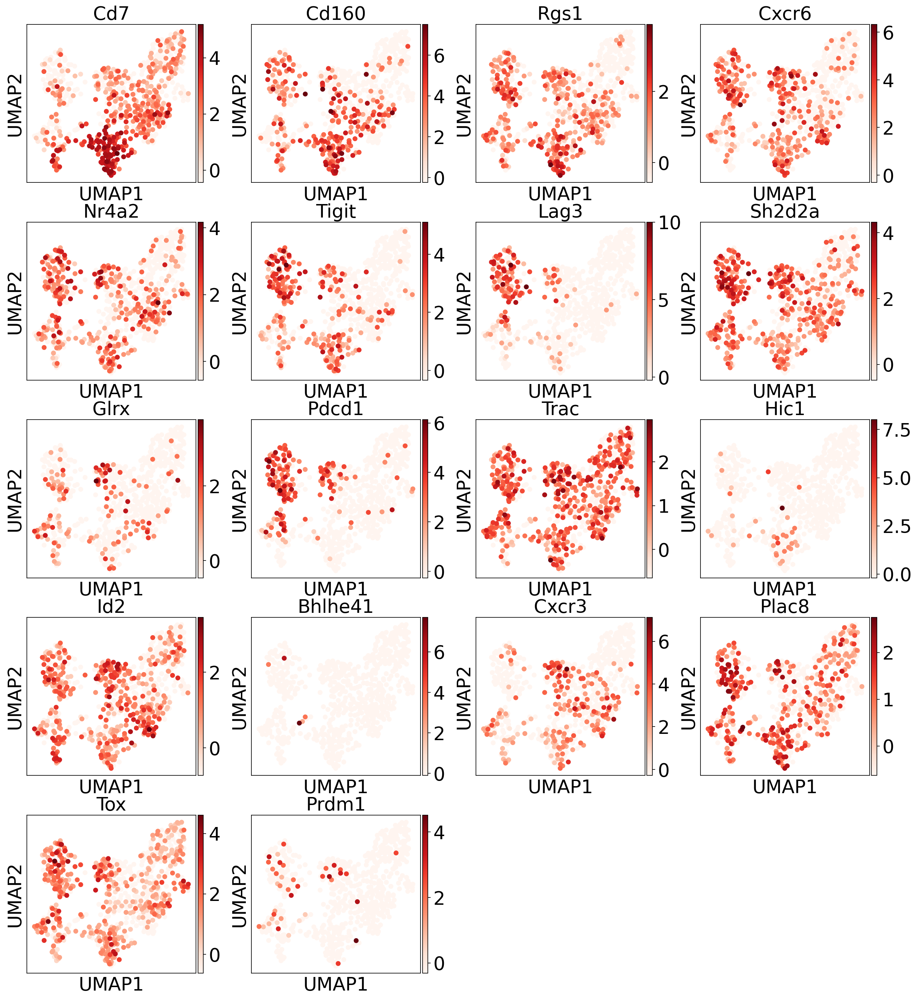

In [23]:
for ct in marker_in_data:
    print(f"{ct.upper()}:")  
    sc.pl.umap(
        trna,
        color=marker_in_data[ct],
        cmap="Reds", 
    )
    print("\n\n\n")  

In [24]:
sc.set_figure_params(scanpy=True, fontsize=24)

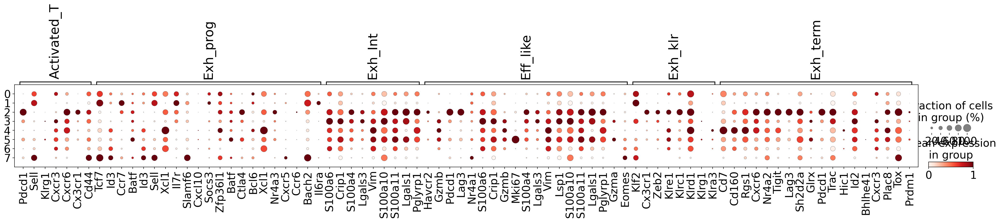

In [25]:
sc.pl.dotplot(
    trna,
    groupby="t_leiden_res0_75",
    var_names=marker_in_data,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

## annotate with DEG

In [26]:
sc.tl.rank_genes_groups(
    trna, groupby="t_leiden_res0_75", method="wilcoxon", key_added="DEG_leiden_res0_75",
)

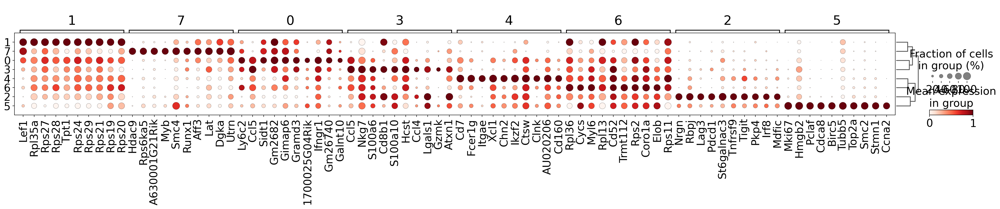

In [27]:
sc.pl.rank_genes_groups_dotplot(
    trna, groupby="t_leiden_res0_75", standard_scale="var", n_genes=10, key="DEG_leiden_res0_75"
)

In [28]:
result = trna.uns['DEG_leiden_res0_75']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group] for group in groups for key in ['names', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj']}
)

In [29]:
degs.to_csv("/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/makers/markers_t_res075.csv")

## annotate with protein

In [30]:
tprot = tmdata.mod["prot"].copy()

In [31]:
tprot.obs['t_leiden_res0_75'] = trna.obs['t_leiden_res0_75']

In [32]:
sc.tl.rank_genes_groups(
    tprot, groupby="t_leiden_res0_75", method="wilcoxon", key_added="DEG_leiden_res0_75",
)

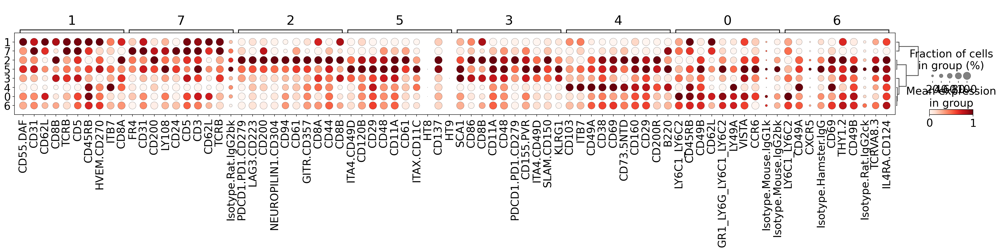

In [33]:
sc.pl.rank_genes_groups_dotplot(
    tprot, groupby="t_leiden_res0_75", standard_scale="var", n_genes=10, key="DEG_leiden_res0_75"
)

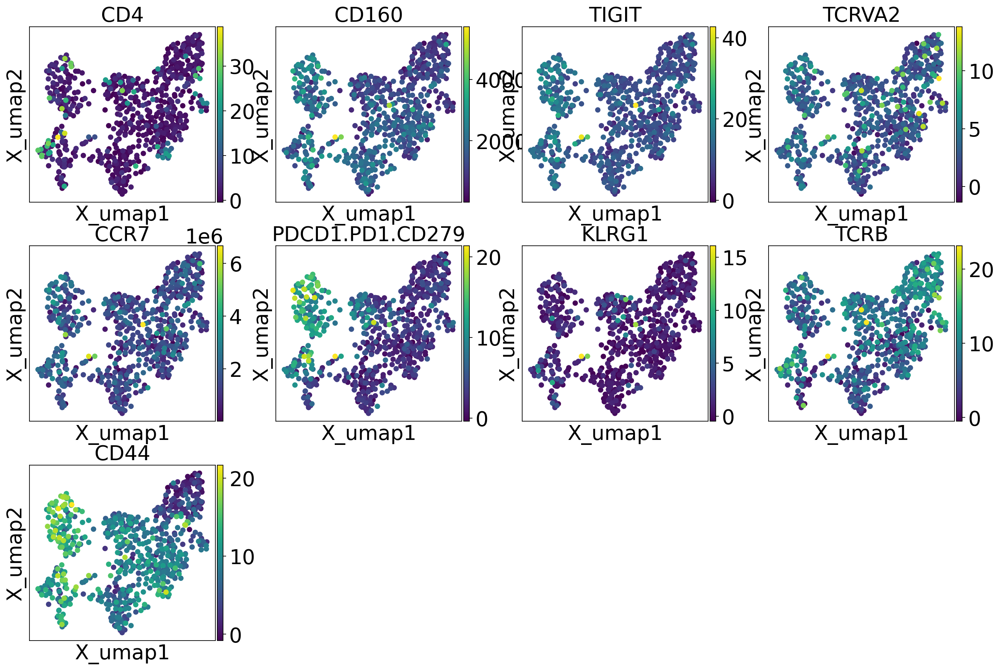

In [34]:
    mu.pl.embedding(
        tmdata, 
        basis="rna:X_umap", 
        color=["CD4","CD160","TIGIT","TCRVA2","CCR7",
              "PDCD1.PD1.CD279","KLRG1","TCRB","CD44"]
    )

# Automated annotation

In [35]:
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 50
📂 Storing models in /home/msun/.celltypist/data/models
💾 Total models to download: 1
💾 Downloading model [1/1]: Immune_All_Low.pkl


In [36]:
model_low = celltypist.Model.load('Immune_All_Low.pkl')
model_low.convert()
model_low.write('mouse_immune_model.pkl')

🧬 Number of genes in the original model: 6639
✅ Conversion done! Number of genes in the converted model: 4760


In [37]:
rna_celltypist = trna.copy()  # make a copy of our rna
rna_celltypist.X = trna.layers["counts"]  # set rna.X to raw counts
sc.pp.normalize_per_cell(
    rna_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(rna_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
rna_celltypist.X = rna_celltypist.X.toarray()

In [38]:
predictions_low = celltypist.annotate(
    rna_celltypist, model='mouse_immune_model.pkl', majority_voting=True
)

🔬 Input data has 750 cells and 55487 genes
🔗 Matching reference genes in the model
🧬 4752 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 5
🗳️ Majority voting the predictions
✅ Majority voting done!


In [39]:
predictions_low_rna = predictions_low.to_adata()

In [40]:
trna.obs["celltypist_cell_label_fine"] = predictions_low_rna.obs.loc[
    trna.obs.index, "majority_voting"
]
trna.obs["celltypist_conf_score_fine"] = predictions_low_rna.obs.loc[
    trna.obs.index, "conf_score"
]

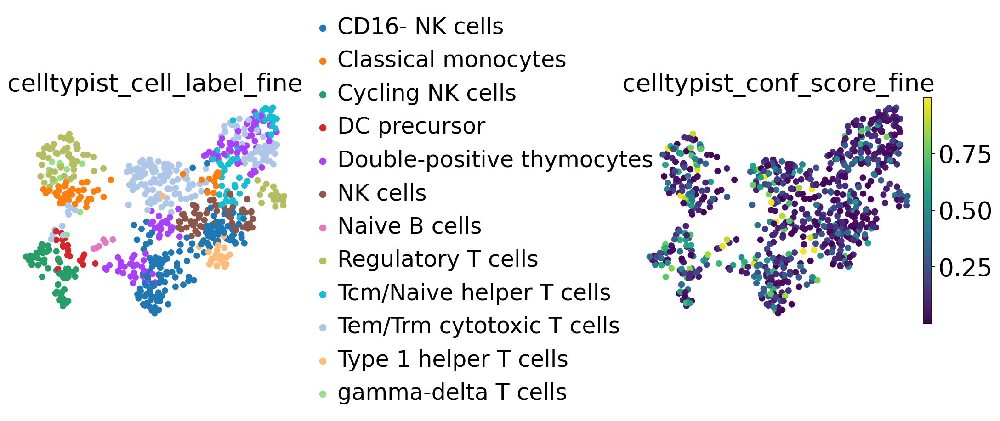

In [41]:
sc.pl.umap(
    trna,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

# Final annotation

In [42]:
fl_annotation = {
    "1": "Naive_T",
    "0": "Exh_prog",
    "3": "Exh_Int",
    "6": "Exh_prog",
    "4": "Exh_term",
    "5": "Proliferating_T",
    "2": "Eff_like"
}

In [43]:
trna.obs["Tcelltype_V1"] = trna.obs.t_leiden_res0_75.map(fl_annotation)

... storing 'Tcelltype_V1' as categorical


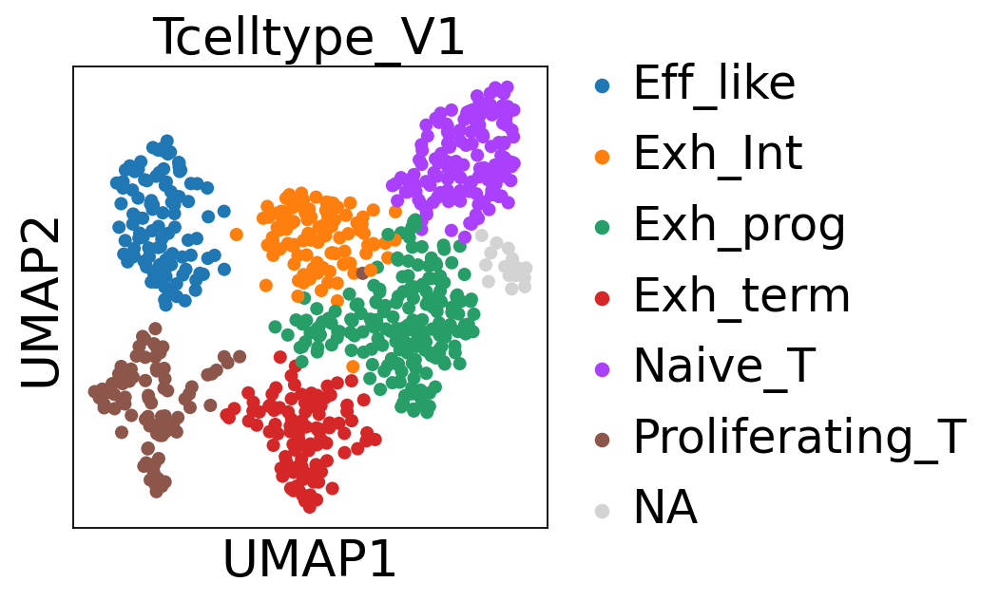

In [44]:
sc.pl.umap(trna, color=["Tcelltype_V1"])

In [45]:
tmdata.mod['rna'] = trna

In [46]:
tmdata.update()
tmdata.write("/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/annotated_citeseq_nospleen_cd8t.h5mu")

/data/msun/miniconda3/envs/CITE/lib/python3.12/site-packages/anndata/_core/anndata.py:1209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c
... storing 'feature_types' as categorical


In [47]:
trna.write("/data/msun/projects/Stephen/PDAC_scRNA/01_process_annnotate/annotated_rna_nospleen_cd8t.h5ad")